In [1]:
import numpy as np
import pylab as plt
import pandas as pd
import seaborn as sns

In [2]:
import sys
sys.path.append('../data/weebit')
from weebit_loader import text_features_df, features_mask, features_y_mask,\
                           X_all, y_all, feature_names

Using TensorFlow backend.


## Features Statistics

In [3]:
text_features_df.loc[:, features_mask].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
feature_adj,3636.0,0.076403,0.029505,0.000000,0.058186,0.075167,0.093993,0.218750
feature_adverbs,3636.0,0.518306,0.284784,0.000000,0.333333,0.500000,0.666667,3.000000
feature_avgnpsize,3636.0,2.935227,0.614295,1.000000,2.555556,2.883156,3.260357,9.875000
feature_avgparsetreeheight,3636.0,5.591294,1.075038,2.000000,4.857143,5.571429,6.285714,10.333333
feature_avgppsize,3636.0,4.103977,1.059090,0.000000,3.500000,4.000000,4.623463,11.714286
feature_avgvpsize,3636.0,6.786518,1.695810,0.000000,5.736455,6.666667,7.700000,22.583333
feature_conj,3636.0,0.099080,0.026367,0.000000,0.082868,0.099241,0.114943,0.250000
feature_interj,3636.0,0.007128,0.027863,0.000000,0.000000,0.000000,0.000000,0.571429
feature_modals,3636.0,0.160147,0.154682,0.000000,0.041667,0.125000,0.238095,1.000000
feature_nouns,3636.0,0.278827,0.052950,0.072727,0.247525,0.278157,0.306228,0.682759


## Features Correlations

In [4]:
fs_corr_df = text_features_df.loc[:, features_mask].corr()

In [5]:
fs_single_corrs = (fs_corr_df.unstack()
                     .sort_values(ascending=False)
                         [len(fs_corr_df):][::2])

In [6]:
fs_single_corrs.head(10)

feature_numconstituents     feature_senlen                0.920825
                            feature_avgparsetreeheight    0.903634
feature_numnp               feature_senlen                0.887388
feature_numconstituents     feature_numfuncwords          0.870925
feature_senlen              feature_numfuncwords          0.862974
feature_numnp               feature_numconstituents       0.854490
feature_perpro              feature_pronouns              0.832053
feature_senlen              feature_avgparsetreeheight    0.823100
feature_numconstituents     feature_numvp                 0.812639
feature_avgparsetreeheight  feature_numfuncwords          0.794654
dtype: float64

In [7]:
fs_single_corrs.tail(10)

feature_ver       feature_conj        -0.325900
feature_nouns     feature_numvp       -0.330591
feature_numdet    feature_pronouns    -0.334298
feature_numvb     feature_nouns       -0.355401
feature_pronouns  feature_avgnpsize   -0.368485
feature_nouns     feature_adverbs     -0.375893
feature_pronouns  feature_nouns       -0.414336
feature_nouns     feature_ver         -0.446563
                  feature_perpro      -0.470266
feature_ver       feature_avgnpsize   -0.489839
dtype: float64

In [8]:
fs_single_corrs[(fs_single_corrs < 0.01) & (fs_single_corrs > -0.01)]

feature_numwh        feature_avgppsize      0.007948
feature_avgppsize    feature_whpro          0.006932
feature_numprep      feature_whpro          0.006802
feature_num_comma    feature_nouns          0.005917
feature_avgppsize    feature_interj         0.005758
feature_interj       feature_whpro          0.005500
feature_numvbp       feature_numvbn         0.005434
feature_numnp        feature_numvb          0.005251
feature_numvbg       feature_adj            0.005169
feature_avgppsize    feature_numvb          0.004828
feature_numpp        feature_perpro         0.003832
feature_numprep      feature_propernouns    0.002024
feature_avgvpsize    feature_interj         0.001637
feature_numvbn       feature_numwh          0.001586
feature_numwh        feature_numnp          0.001377
feature_numvbg       feature_interj         0.001282
feature_numsbar      feature_avgnpsize      0.001078
feature_pronouns     feature_numvbd        -0.000193
feature_interj       feature_modals        -0.

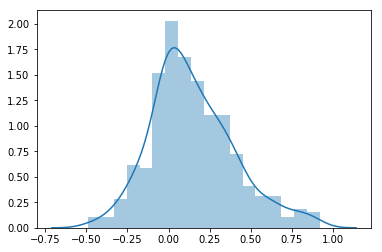

In [9]:
sns.distplot(fs_single_corrs)

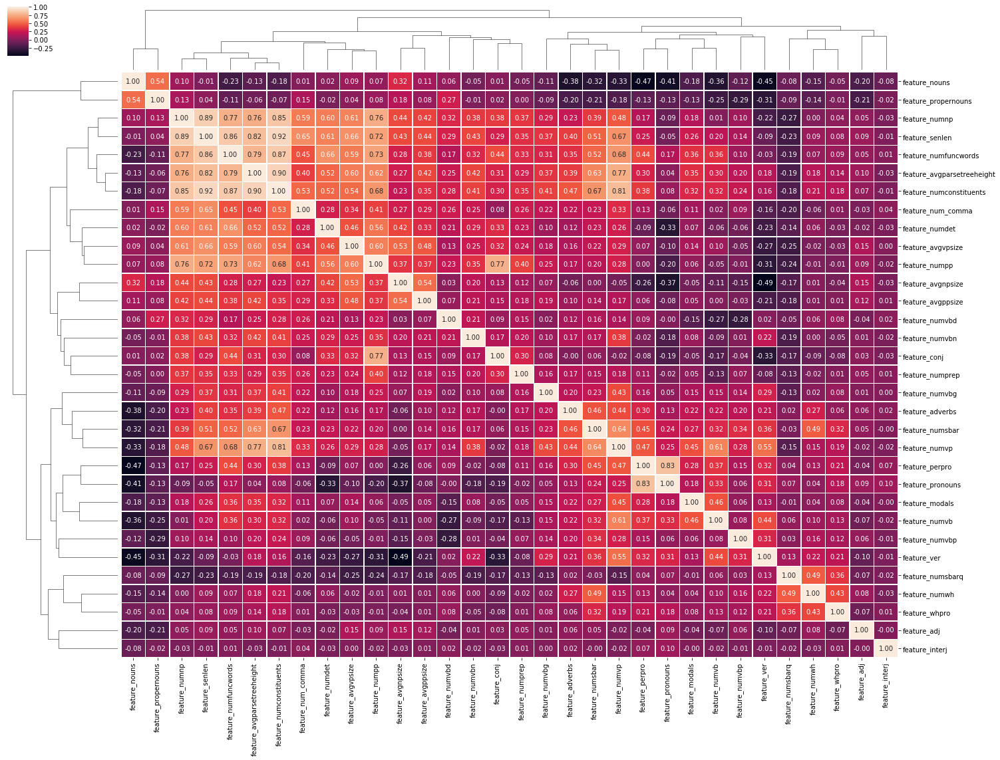

In [10]:
features_clustering = sns.clustermap(fs_corr_df, annot=True, fmt='0.2f', linewidths=.5, figsize=(24, 18))

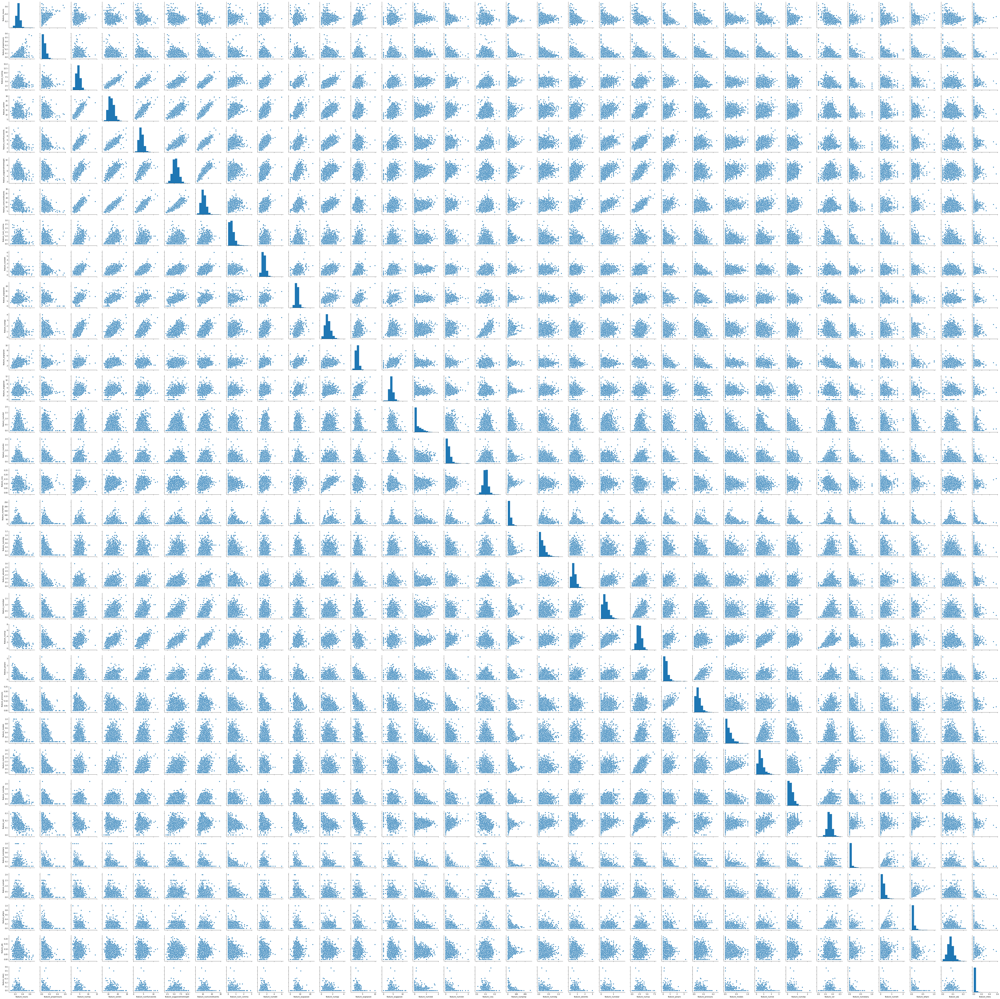

In [11]:
ordered_features_columns = np.take(text_features_df.columns[features_mask],
                    [i for i in features_clustering.dendrogram_col.reordered_ind])
sns.pairplot(text_features_df[ordered_features_columns])

## Features Distribution by Label

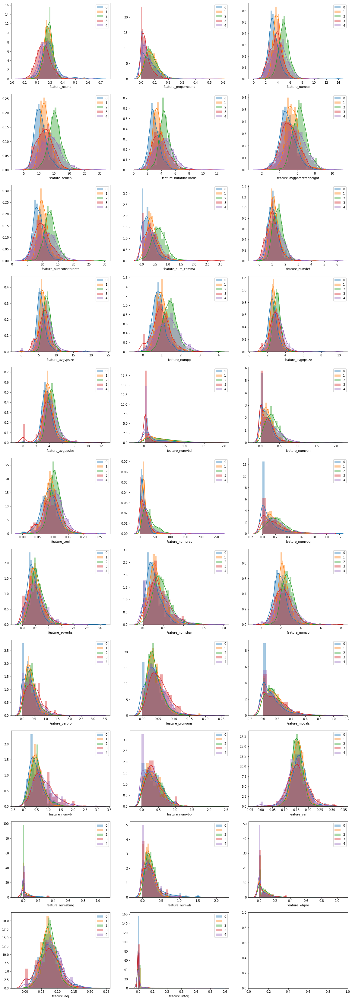

In [12]:
import itertools as it

f, axes = plt.subplots(11, 3, figsize=(20, 60))
axes = it.chain(*axes)

for feature_name, ax in zip(ordered_features_columns, axes):
    for y_value in np.sort(text_features_df['y'].unique()): 
        sns.distplot(text_features_df[text_features_df['y']==y_value][feature_name],
                     label=str(y_value), ax=ax)
    ax.legend()

## Feature Importance

### ANOVA F-value to Features

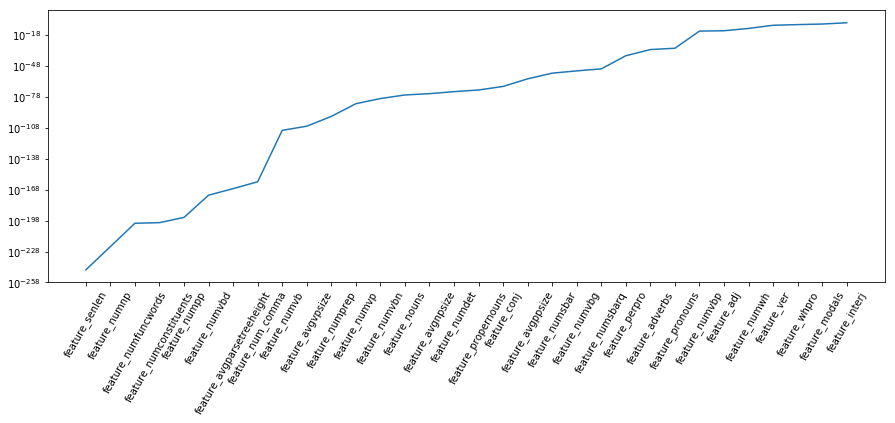

In [13]:
from sklearn.feature_selection import f_classif

_, p_values = f_classif(X_all, y_all)

features_f_classif_order = np.argsort(p_values)
p_values.sort()

f, ax = plt.subplots(figsize=(15, 5))
ax.plot(p_values)
plt.xticks(range(len(p_values)),
           (text_features_df.columns[features_mask][features_f_classif_order]),
          rotation=60)
ax.set_yscale("log")

### Extra Trees

Feature ranking:
1. feature_numvbd (0.056318)
2. feature_senlen (0.046254)
3. feature_numfuncwords (0.040827)
4. feature_propernouns (0.039902)
5. feature_numnp (0.039499)
6. feature_nouns (0.037922)
7. feature_numpp (0.037723)
8. feature_numvb (0.037586)
9. feature_num_comma (0.036222)
10. feature_numconstituents (0.036162)
11. feature_numprep (0.035415)
12. feature_avgnpsize (0.033290)
13. feature_avgparsetreeheight (0.033240)
14. feature_avgvpsize (0.031411)
15. feature_numvbn (0.029105)
16. feature_adj (0.028210)
17. feature_numvp (0.027912)
18. feature_numdet (0.027786)
19. feature_perpro (0.027536)
20. feature_numvbg (0.027413)
21. feature_conj (0.027313)
22. feature_numvbp (0.027234)
23. feature_avgppsize (0.026825)
24. feature_ver (0.026790)
25. feature_pronouns (0.026621)
26. feature_numsbar (0.025667)
27. feature_numwh (0.025379)
28. feature_numsbarq (0.024651)
29. feature_adverbs (0.024491)
30. feature_modals (0.024029)
31. feature_whpro (0.019545)
32. feature_interj (0.0117

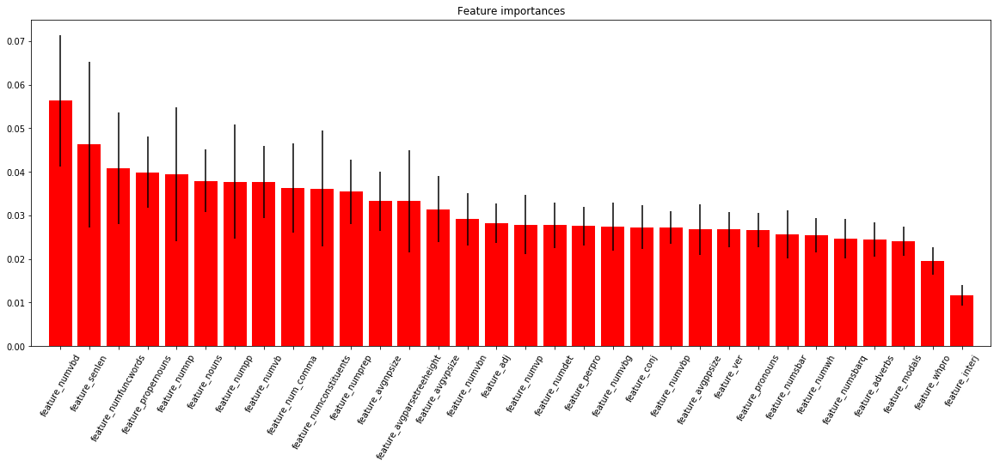

In [14]:
from sklearn.ensemble import ExtraTreesClassifier

forest_model = ExtraTreesClassifier(n_estimators=250,
                              random_state=42)
forest_model.fit(X_all, y_all)

importances = forest_model.feature_importances_

std = np.std([tree.feature_importances_ for tree in forest_model.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

ordered_feature_names = np.take(feature_names, indices
                               )
for f in range(X_all.shape[1]):
    print("%d. %s (%f)" % (f + 1, ordered_feature_names[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(20, 7))
plt.title("Feature importances")
plt.bar(range(X_all.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X_all.shape[1]), ordered_feature_names, rotation=60)
plt.xlim([-1, X_all.shape[1]])
plt.show()

## Embedding Visualization

In [15]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from umap import UMAP

def plot_embedding(embedder, X, y, title=''):
    embedding = embedder.fit_transform(X_all)
    f, ax = plt.subplots(figsize=(15, 15))
    for y_value in np.sort(y_all.unique()):
        mask = (y == y_value)
        
        ax.scatter(embedding[mask, 0], embedding[mask, 1],
                c=sns.color_palette()[y_value], label=y_value, s=8)

    f.gca().set_aspect('equal', 'datalim')
    plt.legend()
    plt.title(embedder.__class__.__name__ + title)

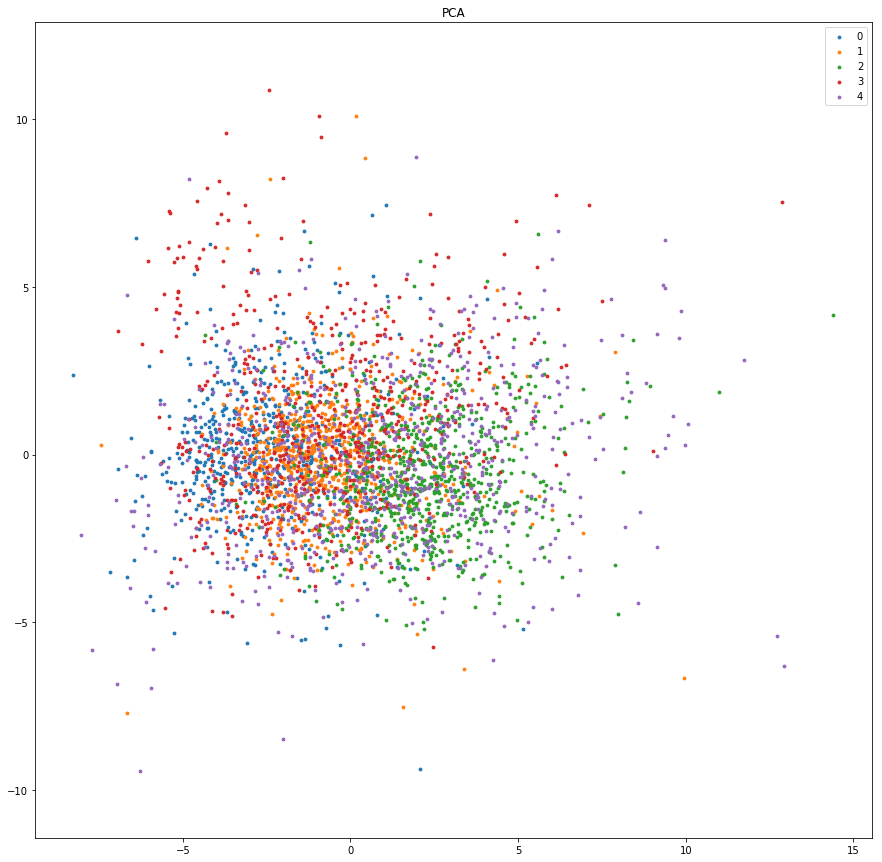

In [16]:
plot_embedding(PCA(), X_all, y_all)

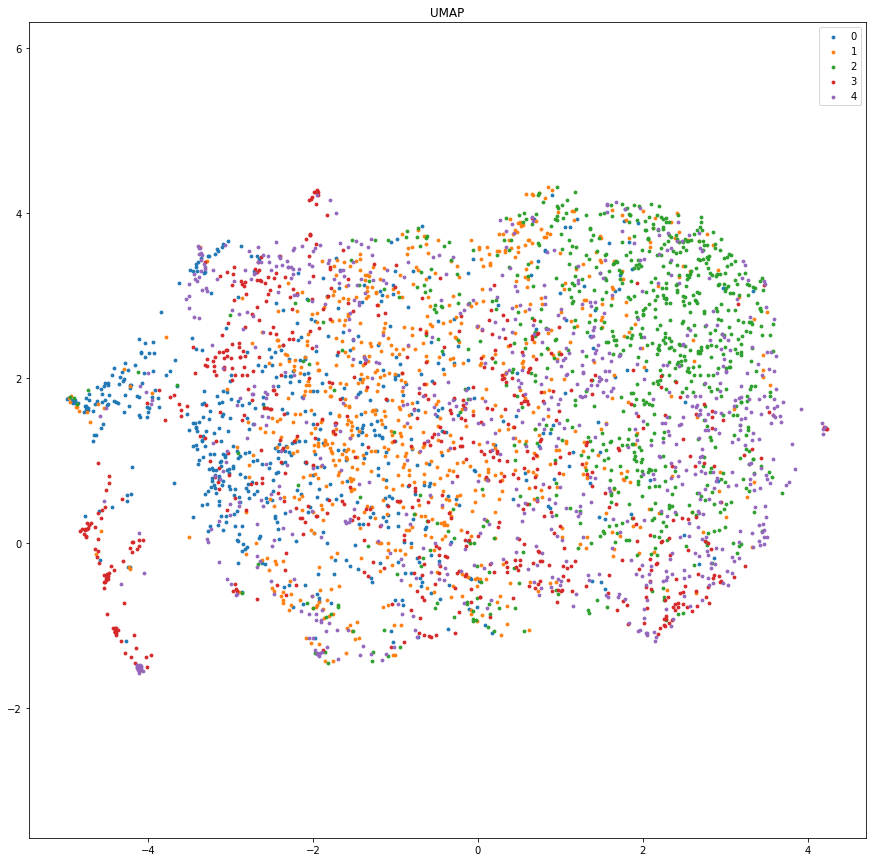

In [17]:
plot_embedding(UMAP(random_state=42), X_all, y_all)

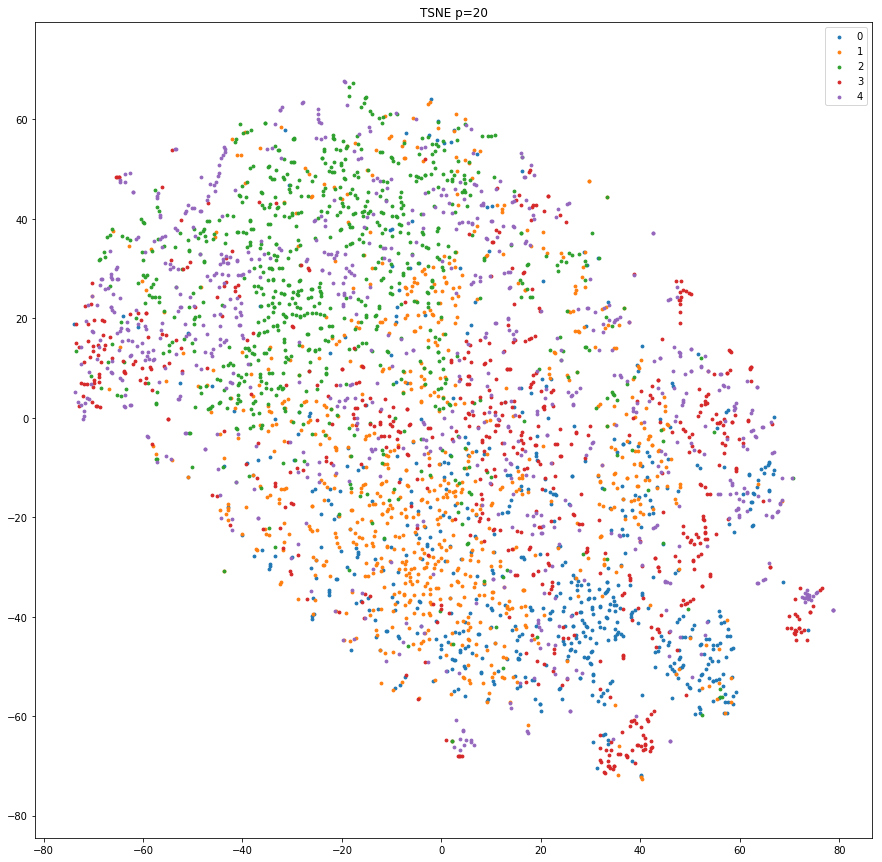

In [18]:
plot_embedding(TSNE(perplexity=20, random_state=42), X_all, y_all, title=' p=20')

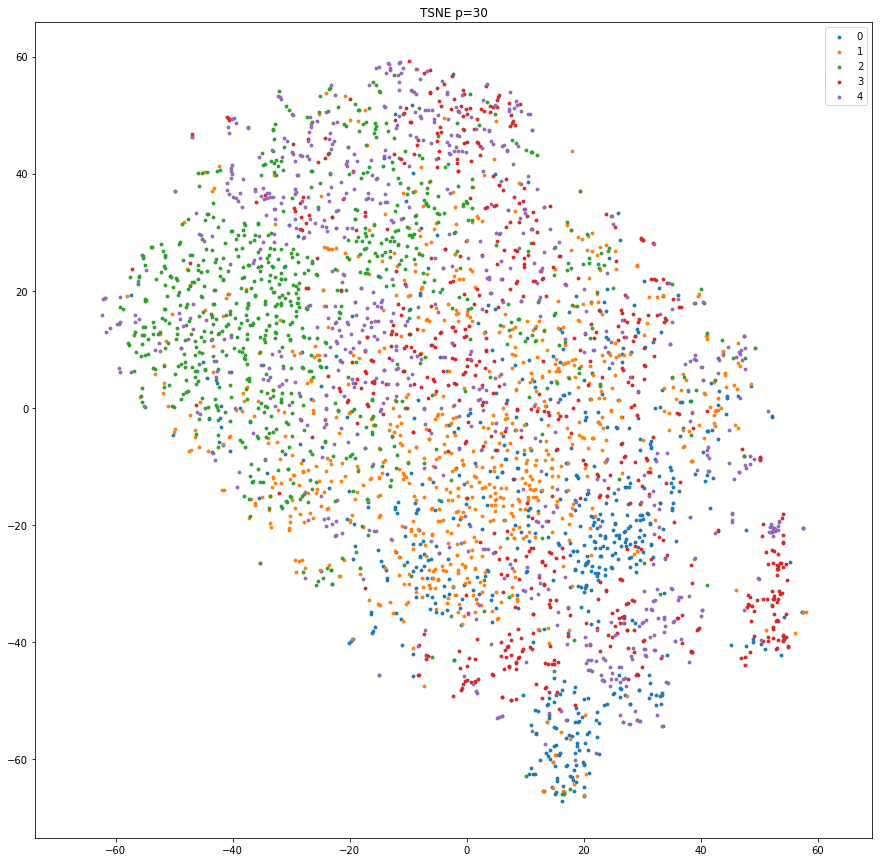

In [19]:
plot_embedding(TSNE(perplexity=30, random_state=42), X_all, y_all, title=' p=30')

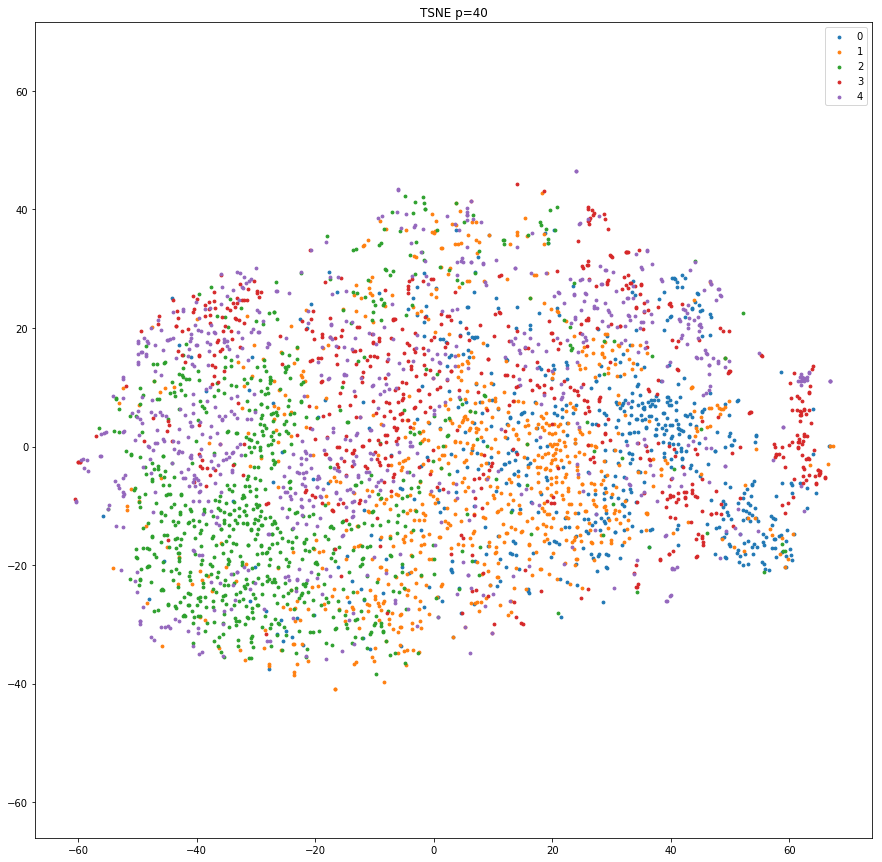

In [20]:
plot_embedding(TSNE(perplexity=40, random_state=42), X_all, y_all, title=' p=40')